## Exploratory Data Analysis for an Audio Dataset for Sound Anomaly Detection

Audio Anomaly Dataset is a subset of the AudioSet dataset, which is a large-scale collection of over 2 million 10-second audio clips from YouTube. The clips are labeled with 527 different categories, including "Gunshot/Gunfire," "Scream," and "Infant Cry."

Contains labeled audio samples of:
  - Normal sounds (background noise or conversations)
  - Anomalous events (breaking glass, screams, footsteps)

In this project, only seven classes of anomaly sound will be considered:
- foot 
- police 
- gunshoot
- scream
- glassbreak
- explosion
- babycry


In [1]:
import os
import numpy as np
import pandas as pd
from tqdm import tqdm

import seaborn as sns
import matplotlib.pyplot as plt

import librosa
import librosa.display
from IPython.display import Audio

In [2]:
data = []
dataset_path = "./Audio-Anomaly-Dataset/Audio_dataset"

for subset in os.listdir(dataset_path):
    subset_path = os.path.join(dataset_path, subset)
    if os.path.isdir(subset_path):
        for file in tqdm(os.listdir(subset_path), desc=f"Processing {subset}"):
            if file.endswith(".wav"):
                file_path = os.path.join(subset_path, file)
                class_name = file.split("_")[0]
                y, sr = librosa.load(file_path, sr=16000)
                duration = librosa.get_duration(y=y, sr=sr)
                data.append({"subset": subset, "file": file, "class": class_name, "path": file_path, "duration": duration})

df = pd.DataFrame(data)

Processing tram_dataset: 100%|██████████| 504/504 [00:38<00:00, 12.97it/s]


### Examples of Audio for Each Class

In [85]:
unique_classes = df['class'].unique()

for class_name in unique_classes:
    sample_file = df[df['class'] == class_name].sample(1)['path'].values[0]
    y, sr = librosa.load(sample_file, sr=16000)
    print(f"Class: {class_name}")
    display(Audio(y, rate=sr))

Class: babycry


Class: explosion


Class: foot


Class: glassbreak


Class: gunshoot


Class: police


Class: scream


### General Discriptive Statistics about Dataset

In [ ]:
print("General information about dataset:")
print(df.info())

print("\nSample count by class:")
print(df["class"].value_counts())

print("\nDistribution of audio duration:")
print(df["duration"].describe())

General information about dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5269 entries, 0 to 5268
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   subset    5269 non-null   object 
 1   file      5269 non-null   object 
 2   class     5269 non-null   object 
 3   path      5269 non-null   object 
 4   duration  5269 non-null   float64
dtypes: float64(1), object(4)
memory usage: 205.9+ KB
None

Sample count by class:
class
foot          770
police        764
gunshoot      757
scream        755
glassbreak    742
explosion     741
babycry       740
Name: count, dtype: int64

Distribution of audio duration:
count    5269.0
mean       30.0
std         0.0
min        30.0
25%        30.0
50%        30.0
75%        30.0
max        30.0
Name: duration, dtype: float64


### Distribution of Examples by Class

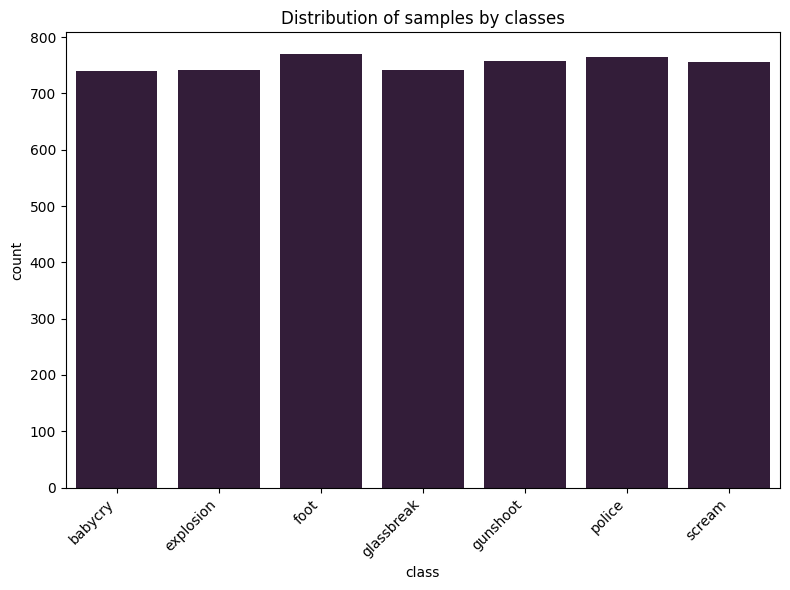

In [87]:
plt.figure(figsize=(8, 6))
sns.countplot(x="class", data=df, color=sns.color_palette("rocket")[0])
plt.title("Distribution of samples by classes")
plt.xticks(rotation=45, ha="right") 
plt.tight_layout()
plt.show()

**Note**: All classes are equally distributed which is good as this aspect is a crucial factor for building a robust and unbiased classification model.

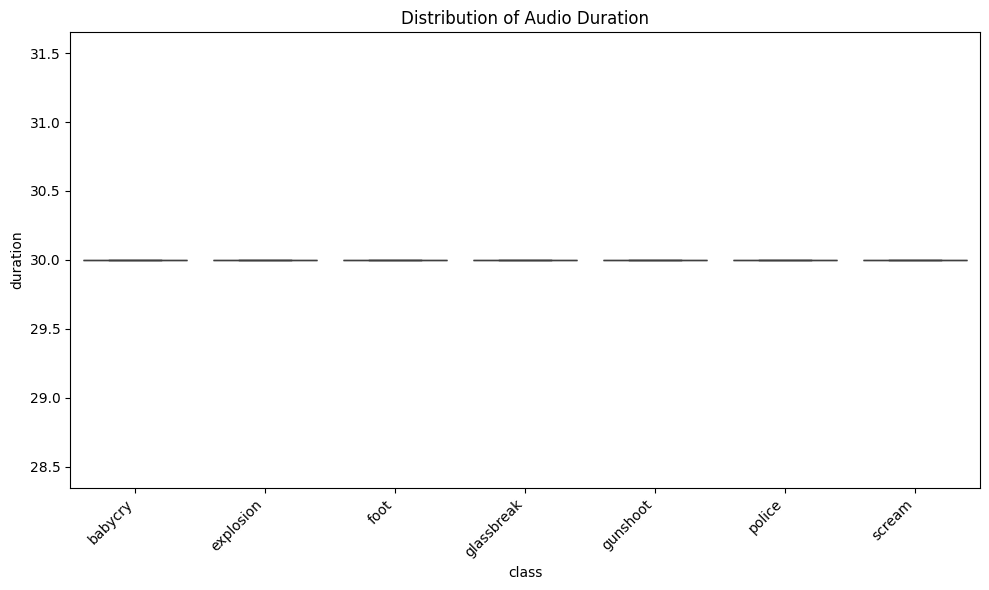

In [88]:
plt.figure(figsize=(10, 6))
sns.boxplot(x="class", y="duration", data=df)
plt.title("Distribution of Audio Duration")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

**Note**: The duration of the audio files remains consistent at 30 seconds.

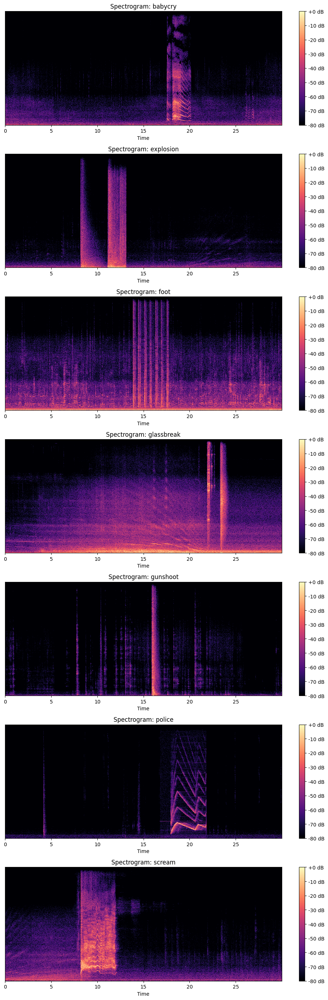

In [90]:
grouped = df.groupby("class")
fig, axes = plt.subplots(nrows=len(grouped), ncols=1, figsize=(10, 4 * len(grouped)))

for i, (class_name, group) in enumerate(grouped):
    sample_file = group["path"].sample().iloc[0]
    y, sr = librosa.load(sample_file)
    D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max) # Calculate the spectrogram
    img = librosa.display.specshow(D, sr=sr, x_axis='time', ax=axes[i] if len(grouped) > 1 else axes)
    axes[i].set_title(f"Spectrogram: {class_name}")

    fig.colorbar(img, ax=axes[i] if len(grouped) > 1 else axes, format='%+2.0f dB')

plt.tight_layout()
plt.show()

**Note**:
One can learn a lot about the frequency composition of a sound by looking at a spectrogram.

* Spectrograms of different classes have distinct differences, which makes it possible to hope for successful classification. The most pronounced differences are observed between classes with different types of sounds (for example, an explosion and footsteps).

* Classes with similar types of sounds (for example, a cry and a scream) may require more careful analysis to distinguish, since they are both the voices of living beings, which are always distinguished on spectrograms by the presence of frequency modulation (waves and curves) and the presence of many overtones.

* The sound of a centrifugal sound alarm (police siren). It can be seen how, as the rotor speed increases, the frequency of the fundamental tone and harmonics increases, the modes of steady-state speed and run-out are visible.

* The sharpness of the sound, characteristic of the beginning of events such as breaking glass, an explosion and a shot, is displayed on spectrograms as sharp vertical lines or bursts.

Due to its weak annotations, where labels merely signify the presence of an anomaly within an audio file and lack precise temporal information, the Audio-Anomaly Dataset presents limitations and requires training methods that can accommodate imprecise labeling.

There is an Example of Weak and Strong Annotation Labeling: 
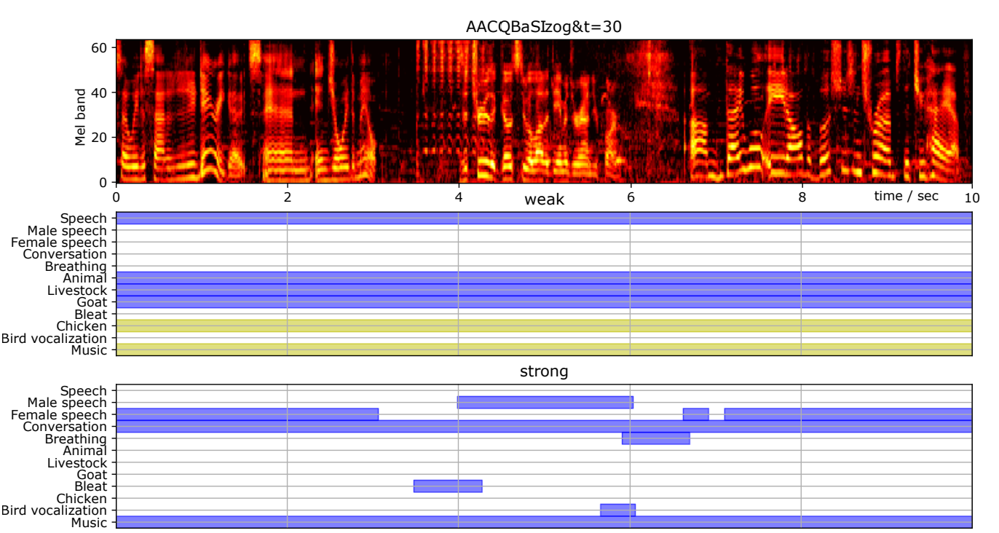